- Import necessary libraries

In [ ]:
import pandas as pd
pd.options.display.max_columns = None # Make all columns visible when printing the dataframe
import numpy as np
import os
import pickle
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import geopy.distance as geodist
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, PowerTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from mycolorpy import colorlist as mcp

- Data Source: https://www.kaggle.com/datasets/gauravmalik26/food-delivery-dataset
- I will only use "train.csv" data for this notebook and split it into train and test sets for model validation, since "test.csv" data from Kaggle does not have target variables.

# 1) Data Reading
- Read dataset and print dataset information

In [2]:
delivery_data = pd.read_csv("data/train.csv", encoding="utf-8")
delivery_data.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [3]:
delivery_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  object 
 3   Delivery_person_Ratings      45593 non-null  object 
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Order_Date                   45593 non-null  object 
 9   Time_Orderd                  45593 non-null  object 
 10  Time_Order_picked            45593 non-null  object 
 11  Weatherconditions            45593 non-null  object 
 12  Road_traffic_density         45593 non-null  object 
 13  Vehicle_conditio

In [4]:
delivery_data.describe()

,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Vehicle_condition
count,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000
mean,17.017729,70.231332,17.465186,70.845702,1.023359
std,8.185109,22.883647,7.335122,21.118812,0.839065
min,-30.905562,-88.366217,0.010000,0.010000,0.000000
25%,12.933284,73.170000,12.988453,73.280000,0.000000
50%,18.546947,75.898497,18.633934,76.002574,1.000000
75%,22.728163,78.044095,22.785049,78.107044,2.000000
max,30.914057,88.433452,31.054057,88.563452,3.000000


# 2) Data Cleaning
- Clean target and feature variables from unnecesarry information 
- Handle NaN values

In [5]:
'''
Remove "min" string from target variable and get numerical target
'''

delivery_data["Time_taken(min)"] = delivery_data["Time_taken(min)"].apply(lambda x: x.replace("(min) ", "")).astype(int)
delivery_data.rename(columns={"Time_taken(min)" : "delivery_time_taken"},inplace=True)

In [6]:
delivery_data["Weatherconditions"].unique()

array(['conditions Sunny', 'conditions Stormy', 'conditions Sandstorms',
       'conditions Cloudy', 'conditions Fog', 'conditions Windy',
       'conditions NaN'], dtype=object)

- Weather conditions feature contians string "NaN" values that we should convert to Null values

In [7]:
'''
Remove "conditions" string from weather conditions feature and convert string "NaN" values to np.nan
'''

delivery_data["Weatherconditions"] = delivery_data["Weatherconditions"].apply(lambda x: x.replace("conditions ", ""))
delivery_data["Weatherconditions"].replace("NaN", np.nan, inplace=True)


In [8]:
delivery_data.isna().sum()

ID                               0
Delivery_person_ID               0
Delivery_person_Age              0
Delivery_person_Ratings          0
Restaurant_latitude              0
Restaurant_longitude             0
Delivery_location_latitude       0
Delivery_location_longitude      0
Order_Date                       0
Time_Orderd                      0
Time_Order_picked                0
Weatherconditions              616
Road_traffic_density             0
Vehicle_condition                0
Type_of_order                    0
Type_of_vehicle                  0
multiple_deliveries              0
Festival                         0
City                             0
delivery_time_taken              0
dtype: int64

- Other features do not contain object Null values so we should investiage if they have string "NaN" values or not

In [9]:
print(delivery_data["Road_traffic_density"].unique())

['High ' 'Jam ' 'Low ' 'Medium ' 'NaN ']


In [10]:
'''
It seems "NaN" strings have a space after them, convert both "NaN " and "NaN" to object Null values
'''

delivery_data.replace("NaN ", np.nan, inplace=True)
delivery_data.replace("NaN", np.nan, inplace=True)

delivery_data.isna().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weatherconditions               616
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
delivery_time_taken               0
dtype: int64

- We should handle Null values. I will use imputation beacuse not want to lose any information
    - Mean imputation for numerical variables and mode imputation for categorical variables seems proper for this dataset
    	- "Time_Orderd" NaN's will replace with rows "Time_Order_picked" since it is a date variable

In [11]:
mean_cols = ["Delivery_person_Age", "Delivery_person_Ratings"]

mode_cols = ["Weatherconditions", "Road_traffic_density", 
             "multiple_deliveries", "Festival", "City"]

mean_imp = SimpleImputer(missing_values=np.nan, strategy='mean')

for col in mean_cols:
    delivery_data[col] = mean_imp.fit_transform(delivery_data[col].to_numpy().reshape(-1,1))

mode_imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

for col in mode_cols:
    delivery_data[col] = mode_imp.fit_transform(delivery_data[col].to_numpy().reshape(-1,1)).reshape(1,-1)[0]

delivery_data["Time_Orderd"] = delivery_data["Time_Orderd"].fillna(delivery_data["Time_Order_picked"])

In [12]:
delivery_data.isna().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Orderd                    0
Time_Order_picked              0
Weatherconditions              0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
multiple_deliveries            0
Festival                       0
City                           0
delivery_time_taken            0
dtype: int64

- Now we do not have any NaN values

# 3) Feature Generation & Explarotary Data Analysis
- Extract new features from existing features to enrich the dataset
- Visualize how delivery time changes w.r.t features
- Examine the relationships of features over delivery time

### a) Generate New Features

In [13]:
coord_features = [
        "Restaurant_latitude", 
        "Restaurant_longitude", 
        "Delivery_location_latitude", 
        "Delivery_location_longitude"
        ]

def calculate_dist(la1,lo1,la2,lo2):

        '''
        Use geopy library to calculate the geodesic distance between restaurants and delivery points by using coordinates
        '''

        return geodist.geodesic((abs(la1),abs(lo1)), (abs(la2),abs(lo2))).km

delivery_data["distance"] = delivery_data[coord_features].apply(lambda x: calculate_dist(*x), axis=1)
delivery_data.drop(coord_features, axis=1, inplace=True)

In [14]:
def prep_time(df):
    
    '''
    Convert order time and order_picked times to datetime objects and extract time information and calculate preperation time
    '''

    df["order_datetime"] = pd.to_datetime(df["Order_Date"] + ' ' + df["Time_Orderd"], dayfirst=True)
    df["picked_datetime"] = pd.to_datetime(df["Order_Date"] + ' ' + df["Time_Order_picked"], dayfirst=True)

    df = df.drop(["Order_Date", "Time_Orderd", "Time_Order_picked"], axis=1)

    df["ordered_hour"] = df["order_datetime"].apply(lambda x: x.hour)
    df["ordered_min"] = df["order_datetime"].apply(lambda x: x.minute)

    df["picked_hour"] = df["picked_datetime"].apply(lambda x: x.hour)
    df["picked_min"] = df["picked_datetime"].apply(lambda x: x.minute)

    def calc_prep_time(ord_hour, ord_min, pc_hour, pc_min):
        
        '''
        Calculating order preperation times. Careful about:
            - orders given before hour 24 and picked after hour 24
            - order preperation times bigger than 60 minutes
        '''
        
        if ord_hour == pc_hour:
            if pc_min > ord_min:
                return pc_min - ord_min
            else:
                return 0

        else:
            return 60 - ord_min + pc_min

    df["prep_min"] = df.iloc[:,-4:].apply(lambda x: calc_prep_time(*x), axis=1)
    
    return df

delivery_data = prep_time(delivery_data)

In [15]:
def create_date_intervals(df):
    
    '''
    Create date intervals as; is weekend or not, periods of month and quarters of year
    '''

    df["is_weekend"] = delivery_data["order_datetime"].dt.day_of_week > 4

    df["month_intervals"] = df["order_datetime"].apply(lambda x: "start_month" if x.day <=10 
                                                   else ("middle_month" if x.day <= 20 else "end_month"))

    df["year_quarter"] = df["order_datetime"].apply(lambda x: x.quarter)

    return df

delivery_data = create_date_intervals(delivery_data)

### b) Visualize Data

In [16]:
variables_df = delivery_data.copy()

variables_df = variables_df.drop(["ID", "Delivery_person_ID", "order_datetime", 
                            "picked_datetime", "picked_hour", "picked_min"], axis=1)
variables_df.head()

,Delivery_person_Age,Delivery_person_Ratings,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,delivery_time_taken,distance,ordered_hour,ordered_min,prep_min,is_weekend,month_intervals,year_quarter
0,37.0,4.9,Sunny,High,2,Snack,motorcycle,0,No,Urban,24,3.020737,11,30,15,True,middle_month,1
1,34.0,4.5,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,33,20.143737,19,45,5,False,end_month,1
2,23.0,4.4,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,26,1.549693,8,30,15,True,middle_month,1
3,38.0,4.7,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,21,7.774497,18,0,10,False,start_month,2
4,32.0,4.6,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,30,6.197898,13,30,15,True,end_month,1


In [17]:
variables_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Delivery_person_Age      45593 non-null  float64
 1   Delivery_person_Ratings  45593 non-null  float64
 2   Weatherconditions        45593 non-null  object 
 3   Road_traffic_density     45593 non-null  object 
 4   Vehicle_condition        45593 non-null  int64  
 5   Type_of_order            45593 non-null  object 
 6   Type_of_vehicle          45593 non-null  object 
 7   multiple_deliveries      45593 non-null  object 
 8   Festival                 45593 non-null  object 
 9   City                     45593 non-null  object 
 10  delivery_time_taken      45593 non-null  int32  
 11  distance                 45593 non-null  float64
 12  ordered_hour             45593 non-null  int64  
 13  ordered_min              45593 non-null  int64  
 14  prep_min              

In [18]:
variables_df.describe()

,Delivery_person_Age,Delivery_person_Ratings,Vehicle_condition,delivery_time_taken,distance,ordered_hour,ordered_min,prep_min,year_quarter
count,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000
mean,29.567137,4.633780,1.023359,26.294607,9.718922,17.407102,29.499704,9.610138,1.139539
std,5.695692,0.327638,0.839065,9.383806,5.599119,4.846890,16.652575,4.440525,0.346512
min,15.000000,1.000000,0.000000,10.000000,1.463837,0.000000,0.000000,0.000000,1.000000
25%,25.000000,4.600000,0.000000,19.000000,4.654040,15.000000,15.000000,5.000000,1.000000
50%,29.567137,4.700000,1.000000,26.000000,9.203840,19.000000,30.000000,10.000000,1.000000
75%,34.000000,4.800000,2.000000,32.000000,13.660197,21.000000,45.000000,15.000000,1.000000
max,50.000000,6.000000,3.000000,54.000000,20.942906,23.000000,55.000000,15.000000,2.000000


### Bivariate Analysis

In [19]:
target = "delivery_time_taken"
numerical_features = ["Delivery_person_Age", "Delivery_person_Ratings", "distance",
                      "ordered_hour", "ordered_min", "prep_min"]

categorical_features = list(variables_df.drop(columns=numerical_features + [target], axis=1).columns)

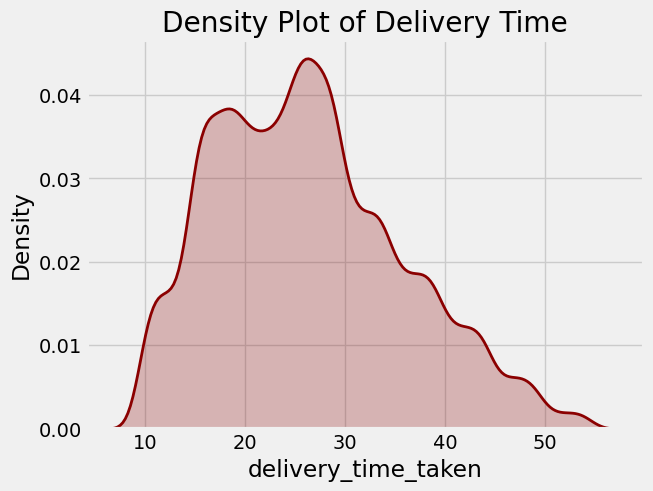

In [20]:
sns.kdeplot(data=variables_df, x=target, shade=True, color="darkred", lw=2)
plt.title("Density Plot of Delivery Time")
plt.show()

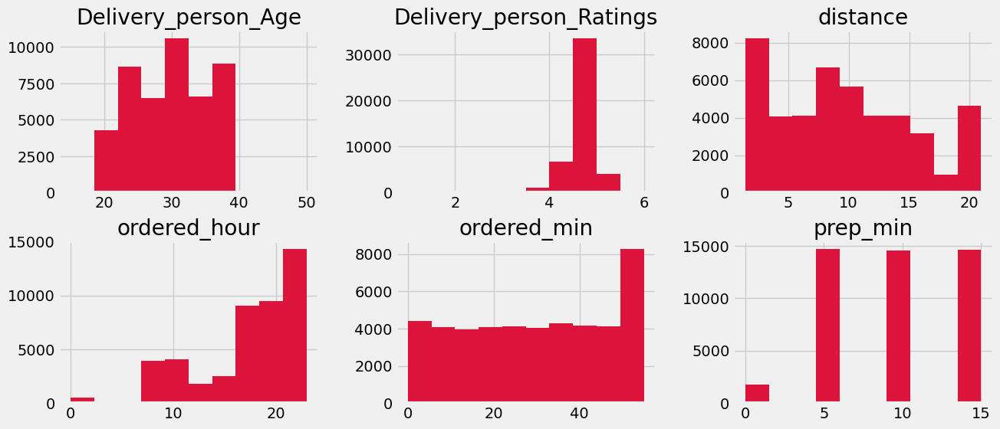

In [21]:
variables_df[numerical_features].hist(layout=(2,3), figsize=(14,6), color="crimson")
plt.show()

- The distributions of numerical features seem to needed a normalization before training the data

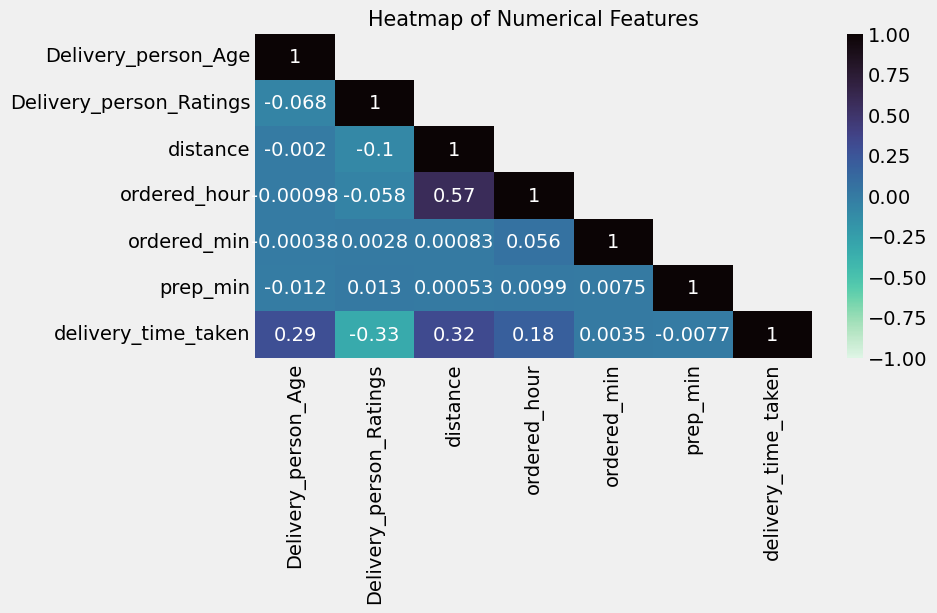

In [22]:
plt.figure(figsize=(8,4))

corr = variables_df[numerical_features + [target]].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(mask, False) # Only display the lower diagonal as the upper diagonal is symmetric of it

sns.heatmap(corr, annot=True, mask=mask, 
    vmin=-1, vmax=1, cmap='mako_r'
    )

plt.grid(False)
plt.title("Heatmap of Numerical Features", fontsize=15)
plt.show()

- The target variable seems to lightly correlated with "Delivery_person_Age" "Delivery_person_Ratings", and "distance" and less lightly correlated with "ordered_hour" parameters.
- "Delivery_person_Ratings" parameter is inversely correlated with the target as the rating of the delivery person decreases, the delivery time increases

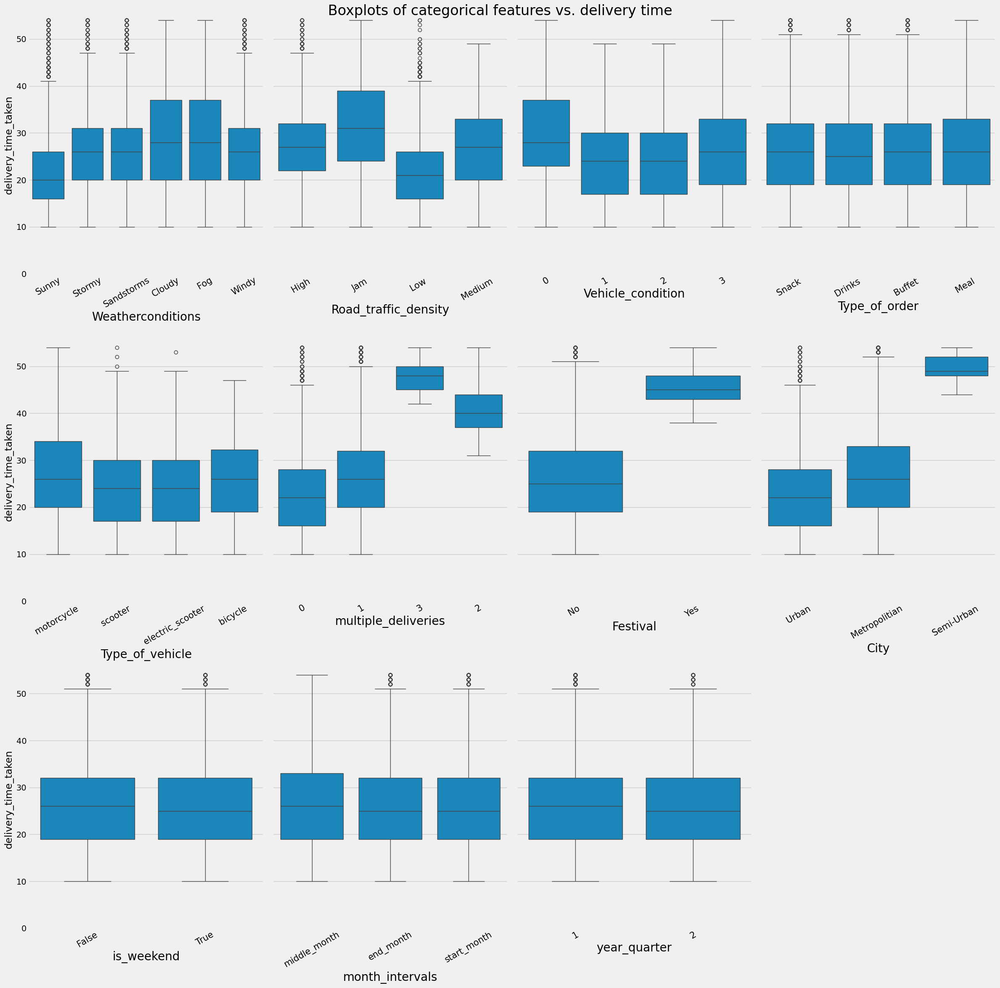

In [23]:
fig, ax = plt.subplots(3,4, figsize=(24,24), sharey=True)
fig.set_tight_layout(True)

row,col = 0,0

for var in categorical_features:
	sns.boxplot(data=variables_df, x=var, y=target, ax=ax[row,col])
	ax[row,col].set_ylim([0,55])
	xlabels = ax[row,col].get_xticklabels()
	ax[row,col].set_xticklabels(xlabels, size=15, rotation=30)
	ax[row,col].set_xlabel(var, fontsize=20)

	if col < 3:
		col += 1 
	else:
		row += 1
		col = 0

fig.delaxes(ax[2,3]) #delete empty plot
fig.suptitle("Boxplots of categorical features vs. delivery time", fontsize=24)
plt.show()

### Multivariate Analysis

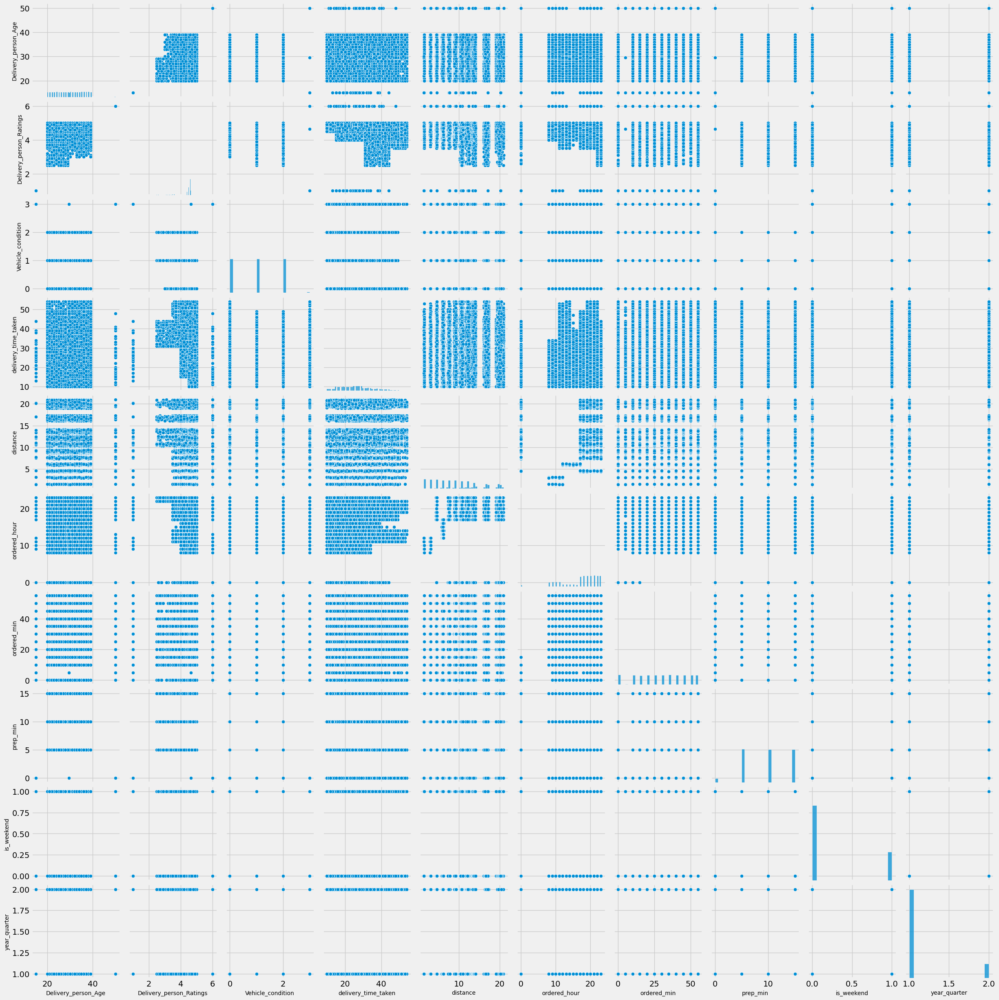

In [24]:
sns.set_context(rc={"axes.labelsize":10})
sns.pairplot(data=variables_df)
plt.show()

- Visualize numerical features vs. categorical features

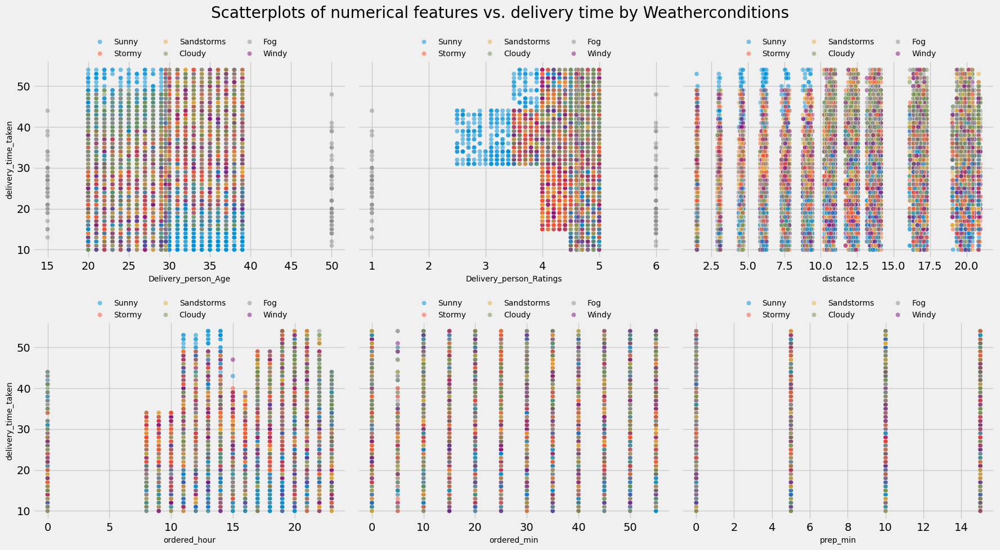

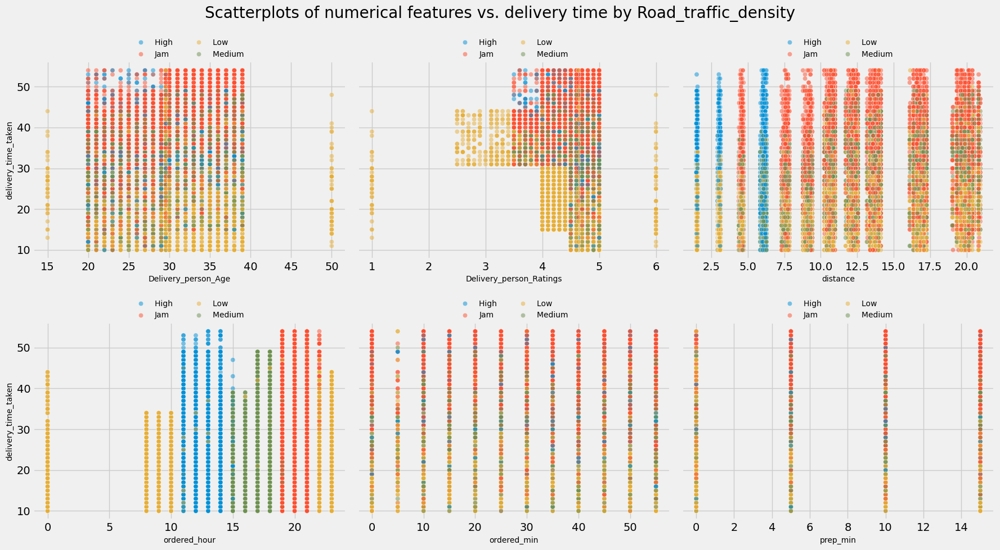

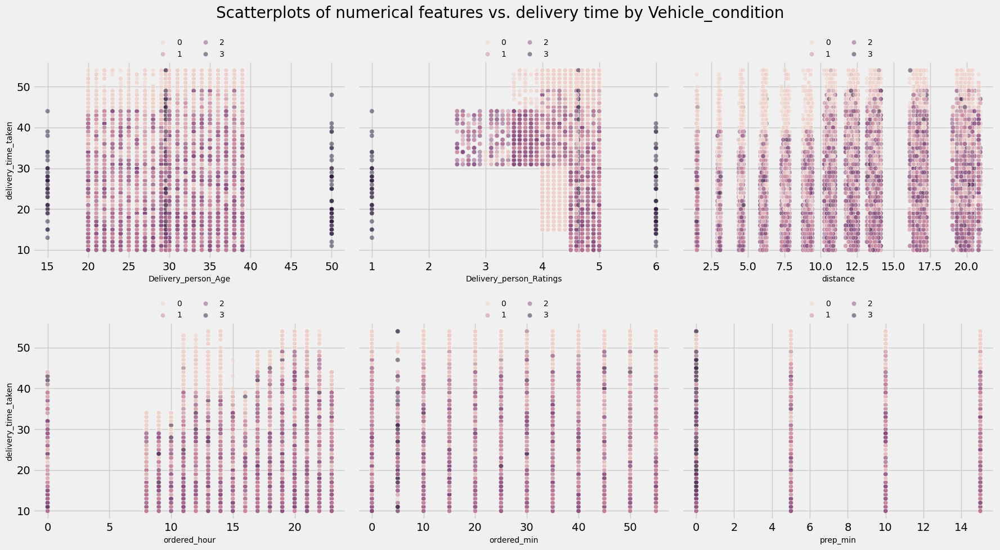

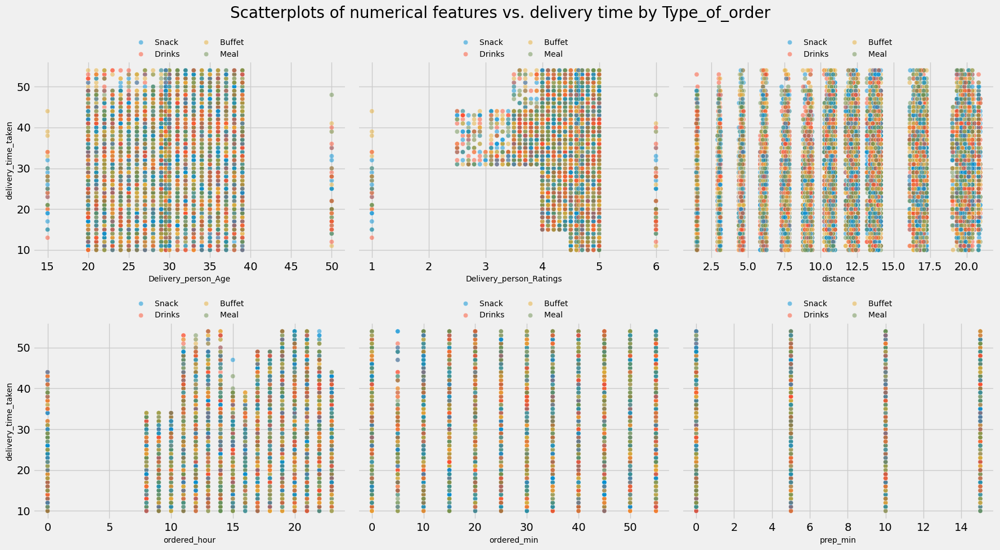

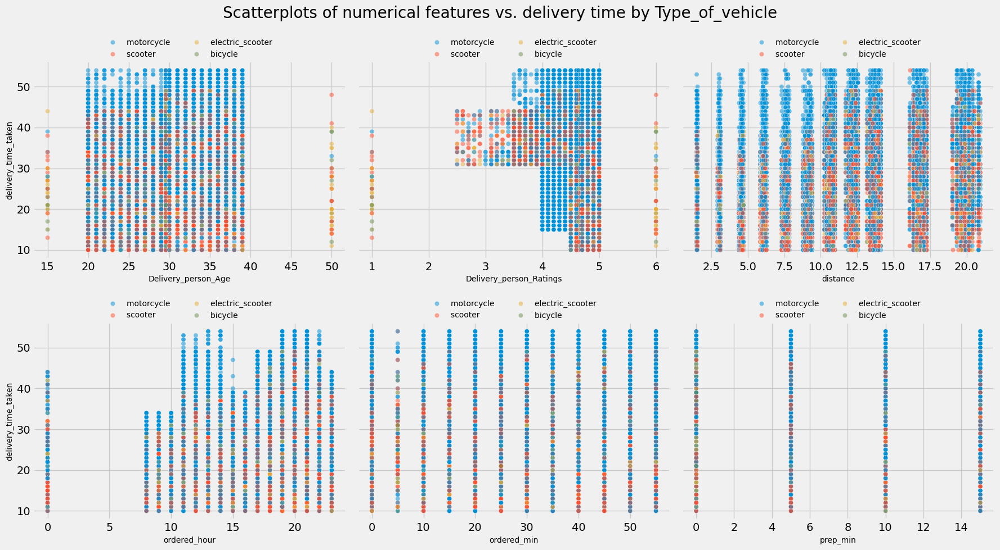

...

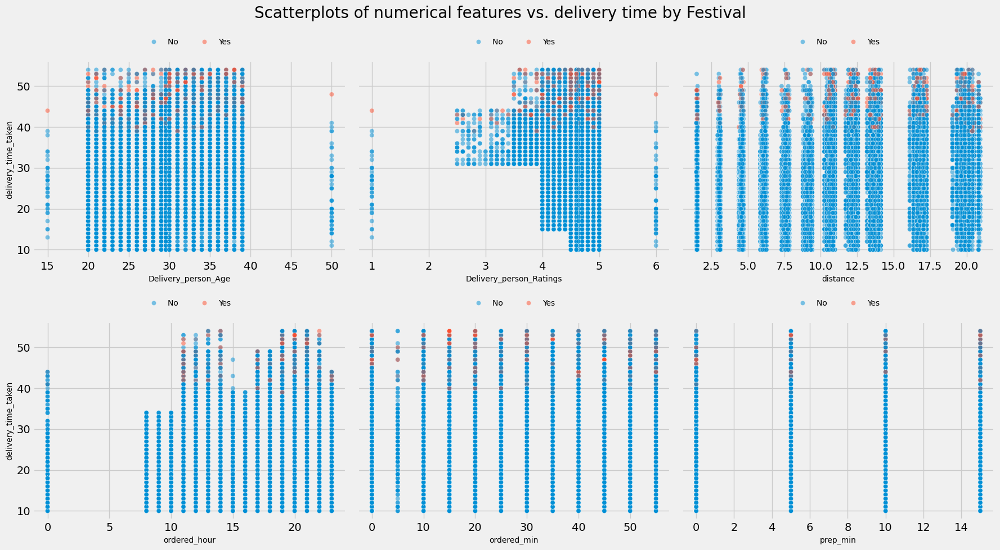

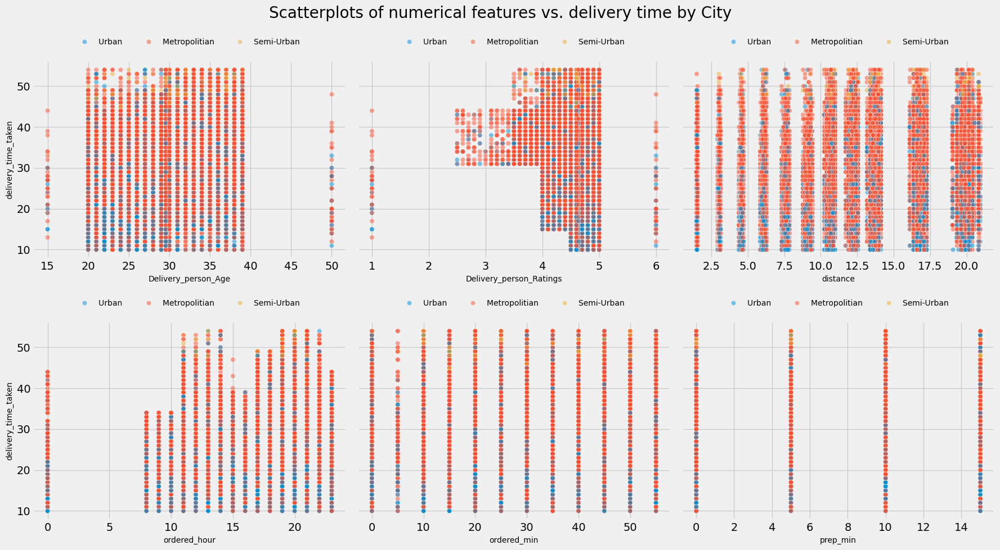

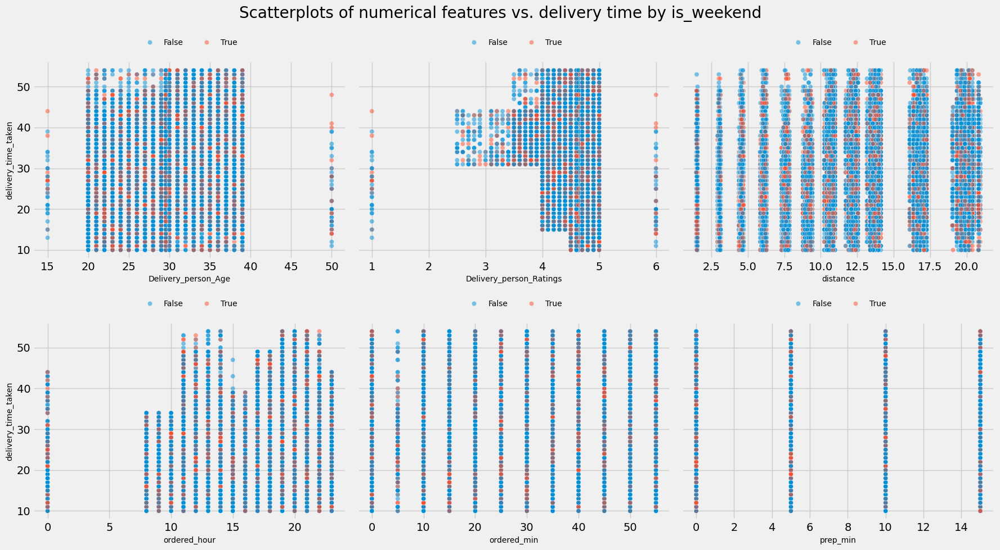

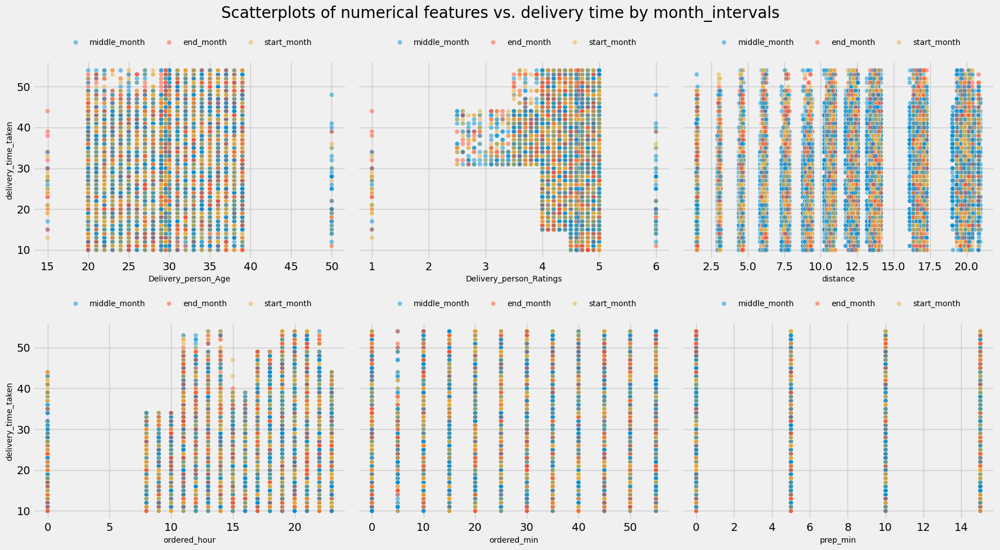

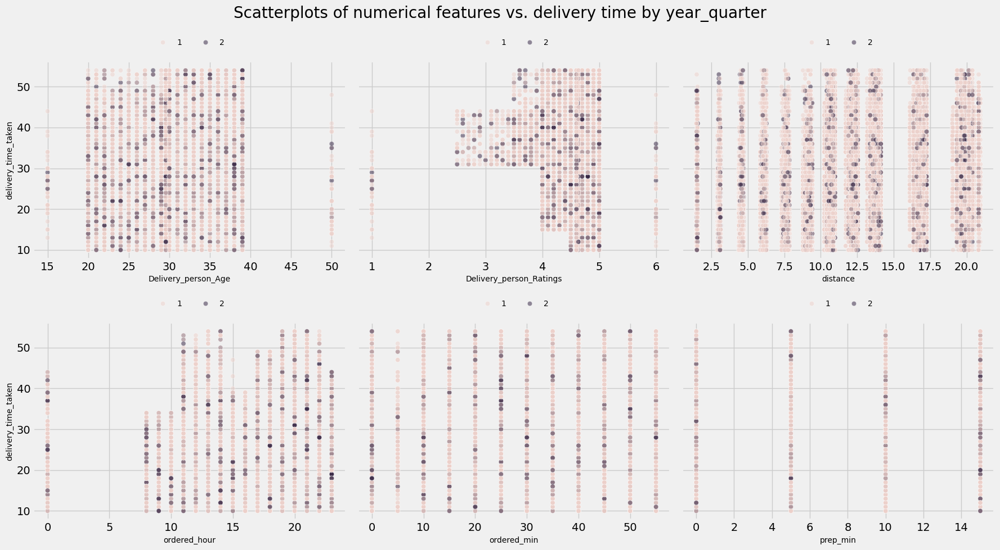

In [25]:
for category in categorical_features:
    fig, ax = plt.subplots(2,3, figsize=(18,10), sharey=True)
    fig.set_tight_layout(True)

    row,col = 0,0

    for var in numerical_features:
        sns.scatterplot(data=variables_df, x=var, y=target, hue=category, ax=ax[row,col], alpha=0.5)
        
        ax[row,col].legend(
            loc='upper center',frameon=False, bbox_to_anchor=(0.5, 1.15), fontsize=10,
            ncol=len(variables_df[category].unique()) if len(variables_df[category].unique()) < 4 else len(variables_df[category].unique())//2
            )
        
        if col < 2:
            col += 1 
        else:
            row += 1
            col = 0

    fig.suptitle(f'Scatterplots of numerical features vs. delivery time by {category}', fontsize=20)
    plt.show()

# 4) Model Training
- Train regression based machine learning models and make predictions
- Make predictions and compare results
- Apply:
  - Standardization
  - Baseline estimation
  - Grid search cross-validaton for hyperparameter tuning
  - Hold-out method for test set
  - Examine feature importances

### a) Pre-Processing

- Convert categorical feature values into numerical values using LabelEncoder

In [26]:
label_enc = LabelEncoder()

for category in categorical_features:
    variables_df[category] = label_enc.fit_transform(variables_df[category])

X = variables_df[numerical_features + categorical_features]
y = variables_df[target]

- Split as train and test sets by size of %33 and apply PowerTransform (log-transformation) scaling to the dataset

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=True, random_state=42)

scaler = PowerTransformer()

X_train = pd.DataFrame(
    data = scaler.fit_transform(X_train),
    columns = X_train.columns
    )

X_test = pd.DataFrame(
    data = scaler.fit_transform(X_test),
    columns = X_test.columns
    )

### b) Baseline Estimation

In [28]:
#Baseline result with Linear Regression

linear_reg = LinearRegression()

cv = KFold(n_splits=5)
baseline_scores = cross_validate(linear_reg, X_train, y_train, cv=cv, scoring=('r2', 'neg_mean_squared_error'))

print("RMSE score of Linear Regression:", np.mean(np.sqrt(-baseline_scores["test_neg_mean_squared_error"])))
print("R^2 score of Linear Regression:", np.mean(baseline_scores["test_r2"]))

RMSE score of Linear Regression: 6.688069179276184
R^2 score of Linear Regression: 0.4927236399651946


### c) Grid Search

- Apply grid search to find best parameters for XGBoost, LightGBM and Random Forest algorithms

##### XGBoost

In [29]:
# XGBoost
params = {
        'max_depth': [3, 6, 10],
        'colsample_bytree': [0.5, 0.75],
        'subsample': [0.5, 0.75],
        'min_split_loss': [0, 0.5, 0.75],
        'reg_alpha': [0, 0.5, 0.75],
        'reg_lambda': [0, 0.5, 0.75]
        }

# Using number of estimators as 200 to make rapid search in parameter space
xgb = XGBRegressor(
        learning_rate=0.5,
        n_estimators=200,
        objective='reg:squarederror', 
        eval_metric='rmse', 
        tree_method="auto", 
        n_jobs=-1
        )

grid = GridSearchCV(estimator=xgb, 
                   param_grid=params,
                   scoring='neg_root_mean_squared_error',
                   cv=3
                   )

grid.fit(X_train, y_train)
print("Best parameters:", grid.best_params_)
print("Lowest RMSE: ", grid.best_score_)

cv_results = grid.cv_results_
cv_results = pd.concat([pd.DataFrame(cv_results["params"]),
                        pd.DataFrame(cv_results["mean_test_score"], columns=["test_mean_rmse"])],
                       axis=1)

cv_results.sort_values(by="test_mean_rmse", ascending=False)[:5]

Best parameters: {'colsample_bytree': 0.75, 'max_depth': 3, 'min_split_loss': 0.75, 'reg_alpha': 0.5, 'reg_lambda': 0.5, 'subsample': 0.75}
Lowest RMSE:  -4.351088201565229


,colsample_bytree,max_depth,min_split_loss,reg_alpha,reg_lambda,subsample,test_mean_rmse
207,0.75,3,0.75,0.50,0.50,0.75,-4.351088
189,0.75,3,0.50,0.50,0.50,0.75,-4.363528
171,0.75,3,0.00,0.50,0.50,0.75,-4.364828
167,0.75,3,0.00,0.00,0.75,0.75,-4.366054
213,0.75,3,0.75,0.75,0.50,0.75,-4.367779


- Choose an optimal number of estimators of XGBoost model by using early stopping method to control overfitting

In [30]:
# Select a low learning rate to avoid overfitting

xgb = XGBRegressor(
    max_depth=3,
    colsample_bytree=0.75,
    subsample=0.75,
    min_split_loss=0.75,
    reg_lambda=0.5,
    reg_alpha=0.5,
    learning_rate=0.01,
    n_estimators=10000,
    objective='reg:squarederror', 
    eval_metric='rmse', 
    tree_method="auto", 
    verbosity=1,
    early_stopping_rounds=30,
    n_jobs=-1
)

cv = KFold(n_splits=5)
for i, (train_index, val_index) in enumerate(cv.split(X_train)):

    xgb.fit(
        X_train.iloc[train_index], y_train.iloc[train_index],
        eval_set = [(X_train.iloc[val_index], y_train.iloc[val_index])],
        verbose=1000
        )

    y_pred = xgb.predict(X_train.iloc[val_index])
    rmse = np.sqrt(mean_squared_error(y_train.iloc[val_index], y_pred))
    r2 = r2_score(y_train.iloc[val_index], y_pred)

    print(f"\nRMSE of Fold {i+1}:", f'{rmse: .2f}')
    print(f"R^2 Score of Fold {i+1}:", f'{r2: .2f}\n')

[0]	validation_0-rmse:9.39807
[1000]	validation_0-rmse:4.54115
[2000]	validation_0-rmse:4.42535
[2998]	validation_0-rmse:4.38583

RMSE of Fold 1:  4.39
R^2 Score of Fold 1:  0.78

[0]	validation_0-rmse:9.39908
[1000]	validation_0-rmse:4.48623
[2000]	validation_0-rmse:4.37052
[3000]	validation_0-rmse:4.32838
[4000]	validation_0-rmse:4.30681
[4322]	validation_0-rmse:4.30164

RMSE of Fold 2:  4.30
R^2 Score of Fold 2:  0.79

[0]	validation_0-rmse:9.30443
[1000]	validation_0-rmse:4.46099
[2000]	validation_0-rmse:4.35143
[3000]	validation_0-rmse:4.30959
[4000]	validation_0-rmse:4.28461
[5000]	validation_0-rmse:4.27165

RMSE of Fold 3:  4.27
R^2 Score of Fold 3:  0.79

[0]	validation_0-rmse:9.32944
[1000]	validation_0-rmse:4.53298
[2000]	validation_0-rmse:4.41526
[3000]	validation_0-rmse:4.36205
[4000]	validation_0-rmse:4.32795
[5000]	validation_0-rmse:4.30797
[5218]	validation_0-rmse:4.30400

RMSE of Fold 4:  4.30
R^2 Score of Fold 4:  0.79

[0]	validation_0-rmse:9.34257
[1000]	validation_0

- Using early stopping method, we can observe that root mean sqaured error metric stopped to improve averagely around estimator number 4000. We can set n_estimators parameter as 4000 with tuned parameters

#### Random Forest

In [31]:
# Random Forest
params = { 
        'max_depth': [3, 6, 10, 50],
        'min_samples_split' : [2, 5, 8],
        'min_samples_leaf' : [1, 3, 5]
        }

rnd = RandomForestRegressor(max_features=None)
grid = GridSearchCV(estimator=rnd, 
                   param_grid=params,
                   scoring='neg_root_mean_squared_error',
                   cv=3
                   )

grid.fit(X_train, y_train)
print("Best parameters:", grid.best_params_)
print("Lowest RMSE: ", grid.best_score_)

cv_results = grid.cv_results_
cv_results = pd.concat([pd.DataFrame(cv_results["params"]),
                        pd.DataFrame(cv_results["mean_test_score"], columns=["test_mean_rmse"])],
                       axis=1)

cv_results.sort_values(by="test_mean_rmse", ascending=False)[:5]

Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Lowest RMSE:  -3.9255869914816173


,max_depth,min_samples_leaf,min_samples_split,test_mean_rmse
18,10,1,2,-3.925587
19,10,1,5,-3.928148
20,10,1,8,-3.929052
23,10,3,8,-3.931060
21,10,3,2,-3.931213


##### LightGBM

In [53]:
# LightGBM
params = {
		'max_depth': [3, 6, 10],
		'num_leaves': [6, 25, 50],
		'min_child_samples': [6,25,50], 
		'min_child_weight': [1e-5, 1e-1, 1, 1e5],
		'colsample_bytree': [0.5, 0.75],
		'subsample': [0.5, 0.75],
		'reg_alpha': [0, 0.5, 0.75],
		'reg_lambda': [0, 0.5, 0.75]
	}

# Using number of iterations as 200 to make rapid search in parameter space
lgbm = LGBMRegressor(
        learning_rate=0.5,
        num_iterations=200,
        objective='regression',
        n_jobs=-1,
        verbosity=-1
        )

grid = GridSearchCV(estimator=lgbm, 
                   param_grid=params,
                   scoring='neg_root_mean_squared_error',
                   cv=3
                   )

grid.fit(X_train, y_train)
print("Best parameters:", grid.best_params_)
print("Lowest RMSE: ", grid.best_score_)

cv_results = grid.cv_results_
cv_results = pd.concat([pd.DataFrame(cv_results["params"]),
                        pd.DataFrame(cv_results["mean_test_score"], columns=["test_mean_rmse"])],
                       axis=1)

cv_results.sort_values(by="test_mean_rmse", ascending=False)[:5]

Best parameters: {'colsample_bytree': 0.75, 'max_depth': 6, 'min_child_samples': 25, 'min_child_weight': 1e-05, 'num_leaves': 6, 'reg_alpha': 0.5, 'reg_lambda': 0.5, 'subsample': 0.5}
Lowest RMSE:  -4.118935184758388


,colsample_bytree,max_depth,min_child_samples,min_child_weight,num_leaves,reg_alpha,reg_lambda,subsample,test_mean_rmse
2816,0.75,6,25,0.00001,6,0.5,0.5,0.50,-4.118935
3573,0.75,10,25,1.00000,6,0.5,0.5,0.75,-4.118935
3464,0.75,10,25,0.00001,6,0.5,0.5,0.50,-4.118935
3465,0.75,10,25,0.00001,6,0.5,0.5,0.75,-4.118935
3518,0.75,10,25,0.10000,6,0.5,0.5,0.50,-4.118935


- Choose an optimal number of estimators for the LightGBM model by using early stopping method to control overfitting

In [54]:
# Select a low learning rate to avoid overfitting

lgbm = LGBMRegressor(
    max_depth=6,
    subsample=0.5,
    min_child_samples=25,
    min_child_weight=1e-05,
    colsample_bytree=0.75,
    num_leaves=6,
    reg_alpha=0.5,
    reg_lambda=0.5,
	learning_rate=0.01,
	num_iterations=10000,
	objective='regression',
	n_jobs=-1,
	early_stopping_round=30,
	verbosity=1,
)

cv = KFold(n_splits=5)
for i, (train_index, val_index) in enumerate(cv.split(X_train)):

    lgbm.fit(
        X_train.iloc[train_index], y_train.iloc[train_index],
        eval_set = [(X_train.iloc[val_index], y_train.iloc[val_index])],
        )

    y_pred = lgbm.predict(X_train.iloc[val_index])
    rmse = np.sqrt(mean_squared_error(y_train.iloc[val_index], y_pred))
    r2 = r2_score(y_train.iloc[val_index], y_pred)

    print(f"\nRMSE of Fold {i+1}:", f'{rmse: .2f}')
    print(f"R^2 Score of Fold {i+1}:", f'{r2: .2f}\n')

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 394
[LightGBM] [Info] Number of data points in the train set: 27355, number of used features: 17
[LightGBM] [Info] Start training from score 26.311241
Training until validation scores don't improve for 30 rounds
Early stopping, best iteration is:
[3715]	valid_0's l2: 18.0416

RMSE of Fold 1:  4.25
R^2 Score of Fold 1:  0.80

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 394
[LightGBM] [Info] Number of data points in the train set: 27355, number of used features: 17
[LightGBM] [Info] Start training from score 26.280241
Training unt

- Using early stopping method, we can observe that root mean sqaured error metric stopped to improve averagely around estimator number 6000. We can set num_iterations parameter as 6000 with tuned parameters

### d) Final Predictions

- Initialize algorithms again with tuned parameters

In [68]:
# Initialize each algorithm with tuned parameters

xgb = XGBRegressor(
    max_depth=3,
    colsample_bytree=0.75,
    subsample=0.75,
    min_split_loss=0.75,
    reg_lambda=0.5,
    reg_alpha=0.5,
    learning_rate=0.01,
    n_estimators=4000,
    objective='reg:squarederror',
    eval_metric='rmse', 
    tree_method="auto", 
    n_jobs=-1
)

rf = RandomForestRegressor(
    max_features=None,
    max_depth = 10, 
    n_estimators = 1000,
    min_samples_split = 2,
    min_samples_leaf = 1
    )

lgbm = LGBMRegressor(
    max_depth=6,
    subsample=0.5,
    min_child_samples=25,
    min_child_weight=1e-05,
    colsample_bytree=0.75,
    num_leaves=6,
    reg_alpha=0.5,
    reg_lambda=0.5,
	learning_rate=0.01,
	num_iterations=6000,
	objective='regression',
	n_jobs=-1,
	verbosity=-1,
)

algorithms = {
            'Baseline (Linear Regression)': linear_reg,
            'XGBoost': xgb,
            'Random Forest': rf,
			'LightGBM': lgbm
        }

- Train the algorithms, get predictions from the test set as final estimations and save the trained models.

In [ ]:
if not os.path.exists('models'):
	os.mkdir('models')

rmse_scores, r2_scores = {}, {}

for algorithm, model in algorithms.items():

	model.fit(X_train, y_train)
	pickle.dump(model, open(f'models/{algorithm}.pkl', 'wb')) # save the models with pickle 

	y_pred = model.predict(X_test)

	rmse_scores[algorithm] = np.sqrt(mean_squared_error(y_test, y_pred))
	r2_scores[algorithm] = r2_score(y_test, y_pred)

- Compare performances of algorithms on test sets with the best parameters and plot the results

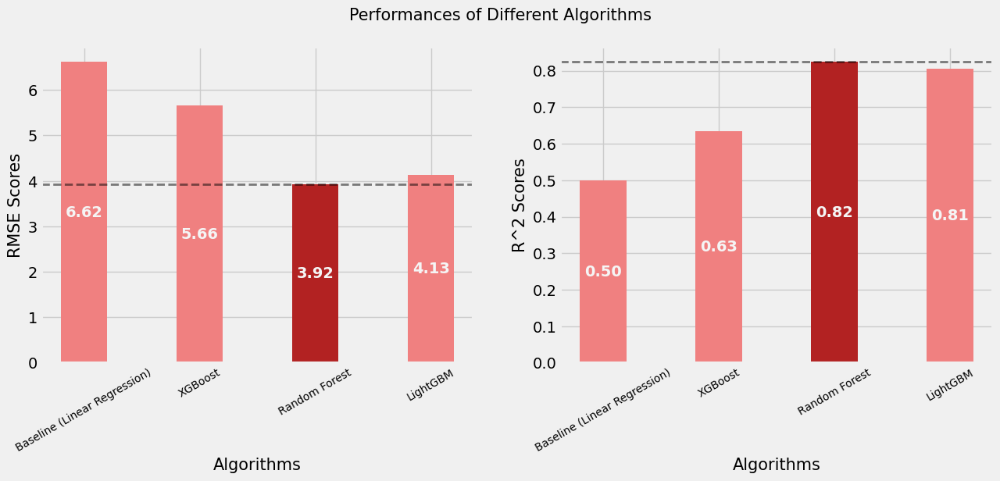

In [72]:
# Plot results on test set
fig, ax = plt.subplots(1,2,figsize=(14,5))

ind = np.arange(len(r2_scores)) + 0.3
width = 0.4

for i,score_dict in enumerate([rmse_scores, r2_scores]): 
    scores = list(score_dict.values())

    bars = ax[i].bar(ind, scores, width, color="lightcoral")
    ax[i].bar_label(bars, fmt='%.2f', weight='bold', label_type='center', color='whitesmoke')
    ax[i].patches[scores.index(min(scores)) if i==0 else scores.index(max(scores))].set_facecolor('firebrick') # Highlight the best resulted bar
    ax[i].axhline(min(scores) if i==0 else max(scores), ls="--", alpha=0.5, color="black", lw=2) # Draw a dashed line of the best algorithm
    ax[i].set_xticks(ind, labels=score_dict.keys(), fontsize=10, rotation=30)
    ax[i].set_xlabel("Algorithms", fontsize=15)
    ax[i].set_ylabel("RMSE Scores" if i==0 else "R^2 Scores", fontsize=15)

fig.suptitle("Performances of Different Algorithms", fontsize=15)
plt.show()

- Random Forest performed best on test sets in terms of both R^2 score and RSME
	- XGBoost performance on validation sets were close to Random Forest but on test set, xgboost performed poorly.
	- LightGBM is the closest one to Random Forest 
	- All tuned algorithms outperformed the baseline performance

### e) Residual Analysis

In [73]:
# Select the best model
model = algorithms["Random Forest"]
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
residuals = [t-p for p,t in zip(y_pred, y_test)]

- Residual plots

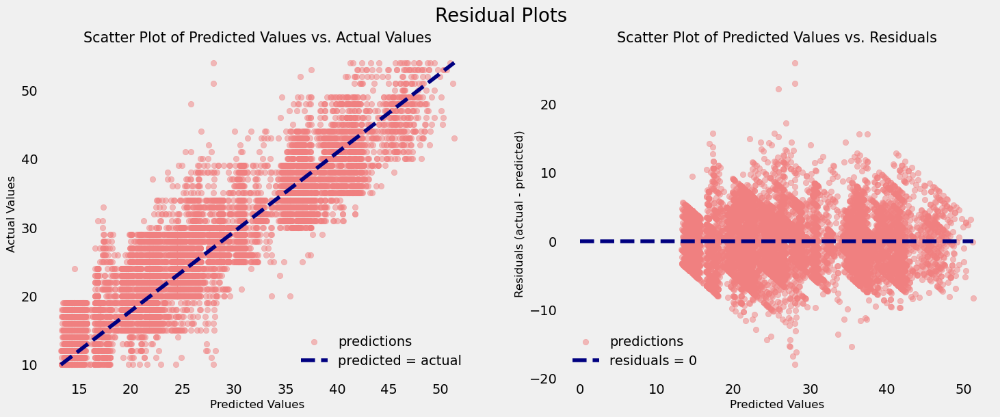

In [ ]:
#Residual plots

fig, ax = plt.subplots(1,2,figsize=(16,6))

ax[0].scatter(x=y_pred, y=y_test, alpha=0.5, color="lightcoral", label="predictions")
ax[0].plot([min(y_pred), max(y_pred)], [min(y_test), max(y_test)], ls="dashed", color="navy", label="predicted = actual")
ax[0].legend(loc="lower right", frameon=False)

ax[0].set_xlabel("Predicted Values", fontsize=12)
ax[0].set_ylabel("Actual Values", fontsize=12)
ax[0].set_title("Scatter Plot of Predicted Values vs. Actual Values", fontsize=15)
ax[0].grid(visible=False)


ax[1].scatter(x=y_pred, y=residuals, alpha=0.5, color="lightcoral", label="predictions")
ax[1].plot([0, max(y_pred)], [0,0], ls="dashed", color="navy", label="residuals = 0")
ax[1].legend(loc="lower left", frameon=False)

ax[1].set_xlabel("Predicted Values", fontsize=12)
ax[1].set_ylabel("Residuals (actual - predicted)", fontsize=12)
ax[1].set_title("Scatter Plot of Predicted Values vs. Residuals", fontsize=15)
ax[1].grid(visible=False)

fig.suptitle("Residual Plots", fontsize=20)
plt.show()

- Plot residual distributions

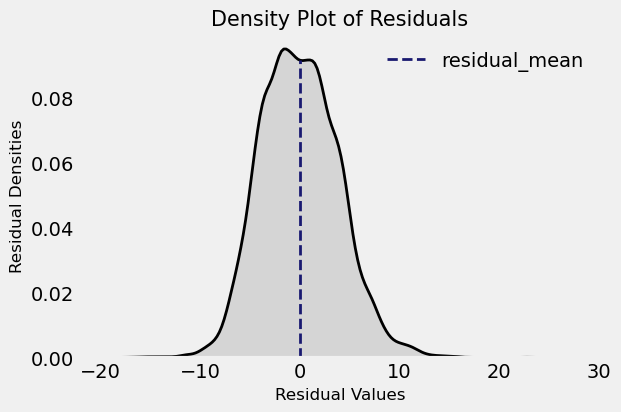

In [75]:
fig, ax = plt.subplots(figsize=(6,4))

ax = sns.kdeplot(residuals, shade=False, color="black", linewidth=2)

kdeline = ax.lines[0]
xs = kdeline.get_xdata()
ys = kdeline.get_ydata()

height = np.interp(np.mean(residuals), xs, ys)
ax.vlines(np.mean(residuals), 0, height, color='midnightblue', ls='dashed', lw=2, label="residual_mean")

ax.fill_between(xs, 0, ys, facecolor='dimgrey', alpha=0.2)

ax.legend(loc="best", frameon=False)

ax.set_xlabel("Residual Values", fontsize=12)
ax.set_ylabel("Residual Densities", fontsize=12)
ax.set_title("Density Plot of Residuals", fontsize=15)
ax.grid(visible=False)
plt.show()

### f) Feature Importances

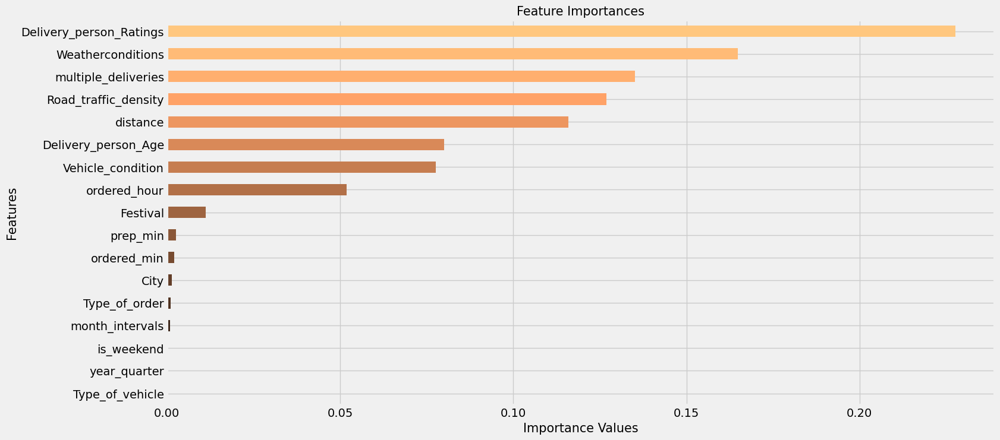

In [76]:
imp = list(model.feature_importances_)

importances = pd.DataFrame({"feature": X_train.columns, "importance": imp})
importances = importances.sort_values(by="importance")

colors = mcp.gen_color(cmap='copper', n=len(importances))

ax = importances.plot(kind='barh', x='feature', y='importance', figsize=(16,8), color=colors, legend=False)
#ax.axvline(0.05, ls="--", color="firebrick")
plt.xlabel("Importance Values", fontsize=15)
plt.ylabel("Features", fontsize=15)
plt.title("Feature Importances", fontsize=15)
plt.show()

- Investigate the relevant and irrelevant features

In [77]:
# Sort feature importances by descending order

importances = importances.sort_values(by="importance", ascending=False)
importances.reset_index(inplace=True, drop=True)
importances.head(3)

,feature,importance
0,Delivery_person_Ratings,0.227594
1,Weatherconditions,0.164864
2,multiple_deliveries,0.135088


- Investigate which features are enough to build the best algorithm 

In [78]:
r2_scores_new = []
for feature_num in range(len(importances)):
    
    new_features = importances["feature"][:feature_num+1]

    X_train_new = X_train[new_features]
    X_test_new = X_test[new_features]

    model.fit(X_train_new, y_train)
    pred = model.predict(X_test_new).reshape(-1,1)

    r2_scores_new.append(r2_score(pred, y_test))

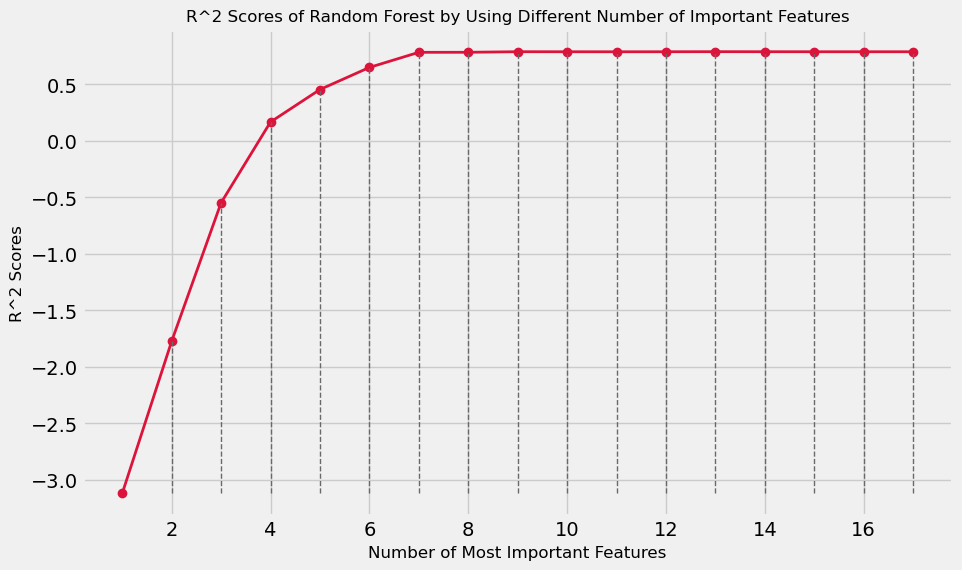

In [79]:
plt.figure(figsize=(10,6))

plt.plot(range(1,len(importances)+1), r2_scores_new, marker="o", lw=2, color="crimson")

plt.vlines(range(1,len(importances)+1), min(r2_scores_new), r2_scores_new, color='dimgray', ls='dashed', lw=1)

plt.xlabel("Number of Most Important Features", fontsize=12)
plt.ylabel("R^2 Scores", fontsize=12)
plt.title("R^2 Scores of Random Forest by Using Different Number of Important Features", fontsize=12)

plt.show()

- It seems the most important 7 features are necessary for model to predict the delivery times. Other features are mostly irrelevant for the model since adding them to the model does not yield significantly better results

In [81]:
# Most important features
importances[:7]

,feature,importance
0,Delivery_person_Ratings,0.227594
1,Weatherconditions,0.164864
2,multiple_deliveries,0.135088
3,Road_traffic_density,0.126903
4,distance,0.115852
5,Delivery_person_Age,0.080020
6,Vehicle_condition,0.077620
